<center> <img src = https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/hh%20label.jpg alt="drawing" style="width:400px;">

# <center> Проект: Анализ резюме из HeadHunter
   

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

# Исследование структуры данных

1. Прочитайте данные с помощью библиотеки Pandas. Совет: перед чтением обратите внимание на разделитель внутри файла. 

In [2]:
#ваш код здесь
data = pd.read_csv('data/dst-3.0_16_1_hh_database.csv', sep=';')
print(data.shape)

(44744, 12)


2. Выведите несколько первых (последних) строк таблицы, чтобы убедиться в том, что ваши данные не повреждены. Ознакомьтесь с признаками и их структурой.

In [3]:
#ваш код здесь
display(data.head(2))

,"Пол, возраст",ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Образование и ВУЗ,Обновление резюме,Авто
0,"Мужчина , 39 лет , родился 27 ноября 1979",29000 руб.,Системный администратор,"Советск (Калининградская область) , не готов к...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, ва...",Опыт работы 16 лет 10 месяцев Август 2010 — п...,"МАОУ ""СОШ № 1 г.Немана""",Системный администратор,Неоконченное высшее образование 2000 Балтийск...,16.04.2019 15:59,Имеется собственный автомобиль
1,"Мужчина , 60 лет , родился 20 марта 1959",40000 руб.,Технический писатель,"Королев , не готов к переезду , готов к редким...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, уд...",Опыт работы 19 лет 5 месяцев Январь 2000 — по...,Временный трудовой коллектив,"Менеджер проекта, Аналитик, Технический писатель",Высшее образование 1981 Военно-космическая ак...,12.04.2019 08:42,Не указано


3. Выведите оснresume_df информацию о числе непустых значений в столбцах и их типах в таблице.

In [5]:
display(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44744 entries, 0 to 44743
Data columns (total 12 columns):
 #   Column                           Non-Null Count  Dtype 
---  ------                           --------------  ----- 
 0   Пол, возраст                     44744 non-null  object
 1   ЗП                               44744 non-null  object
 2   Ищет работу на должность:        44744 non-null  object
 3   Город, переезд, командировки     44744 non-null  object
 4   Занятость                        44744 non-null  object
 5   График                           44744 non-null  object
 6   Опыт работы                      44576 non-null  object
 7   Последнее/нынешнее место работы  44743 non-null  object
 8   Последняя/нынешняя должность     44742 non-null  object
 9   Образование и ВУЗ                44744 non-null  object
 10  Обновление резюме                44744 non-null  object
 11  Авто                             44744 non-null  object
dtypes: object(12)
memory usage: 4.1+

None

4. Обратите внимание на информацию о числе непустых значений.

In [6]:
#ваш код здесь
display(data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44744 entries, 0 to 44743
Data columns (total 12 columns):
 #   Column                           Non-Null Count  Dtype 
---  ------                           --------------  ----- 
 0   Пол, возраст                     44744 non-null  object
 1   ЗП                               44744 non-null  object
 2   Ищет работу на должность:        44744 non-null  object
 3   Город, переезд, командировки     44744 non-null  object
 4   Занятость                        44744 non-null  object
 5   График                           44744 non-null  object
 6   Опыт работы                      44576 non-null  object
 7   Последнее/нынешнее место работы  44743 non-null  object
 8   Последняя/нынешняя должность     44742 non-null  object
 9   Образование и ВУЗ                44744 non-null  object
 10  Обновление резюме                44744 non-null  object
 11  Авто                             44744 non-null  object
dtypes: object(12)
memory usage: 4.1+

None

5. Выведите основную статистическую информацию о столбцах.


In [7]:
#ваш код здесь
display(data.describe())

,"Пол, возраст",ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Образование и ВУЗ,Обновление резюме,Авто
count,44744,44744,44744,44744,44744,44744,44576,44743,44742,44744,44744,44744
unique,16003,690,14929,10063,38,47,44413,30214,16927,40148,18838,2
top,"Мужчина , 32 года , родился 17 сентября 1986",50000 руб.,Системный администратор,"Москва , не готов к переезду , не готов к кома...",полная занятость,полный день,Опыт работы 10 лет 8 месяцев Апрель 2018 — по...,Индивидуальное предпринимательство / частная п...,Системный администратор,Высшее образование 1987 Военный инженерный Кра...,07.05.2019 09:50,Не указано
freq,18,4064,3099,1261,30026,22727,3,935,2062,4,25,32268


# Преобразование данных

1. Начнем с простого - с признака **"Образование и ВУЗ"**. Его текущий формат это: **<Уровень образования год выпуска ВУЗ специальность...>**. Например:
* Высшее образование 2016 Московский авиационный институт (национальный исследовательский университет)...
* Неоконченное высшее образование 2000  Балтийская государственная академия рыбопромыслового флота…
Нас будет интересовать только уровень образования.

Создайте с помощью функции-преобразования новый признак **"Образование"**, который должен иметь 4 категории: "высшее", "неоконченное высшее", "среднее специальное" и "среднее".

Выполните преобразование, ответьте на контрольные вопросы и удалите признак "Образование и ВУЗ".

Совет: обратите внимание на структуру текста в столбце **"Образование и ВУЗ"**. Гарантируется, что текущий уровень образования соискателя всегда находится в первых 2ух слов и начинается с заглавной буквы. Воспользуйтесь этим.

*Совет: проверяйте полученные категории, например, с помощью метода unique()*


In [8]:
#ваш код здесь
#function takes an input string of Education and Institution 
#and returns the education level for each element
def education_level(input_str):
    #split input string by space and save the first two elem of the string
    input_lst = input_str.split(' ')[0:2]
    
    if ' '.join(input_lst) == 'Высшее образование':
        return 'высшее'
    elif ' '.join(input_lst) == 'Неоконченное высшее':
        return 'неоконченное высшее'
    elif ' '.join(input_lst) == 'Среднее специальное':
        return 'среднее специальное'
    elif ' '.join(input_lst) == 'Среднее образование':
        return 'среднее'
    

data['Образование'] = data['Образование и ВУЗ'].apply(education_level)
data = data.drop('Образование и ВУЗ', axis=1)

In [9]:
data['Образование'].value_counts()

Образование
высшее                 33863
среднее специальное     5765
неоконченное высшее     4557
среднее                  559
Name: count, dtype: int64

2. Теперь нас интереcountстолбец **"Пол, возраст"**. Сейчас он представлен в формате **<Пол , возраст , дата рождения >**. Например:
* Мужчина , 39 лет , родился 27 ноября 1979 
* Женщина , 21 год , родилась 13 января 2000
Как вы понимаете, нам необходимо выделить каждый параметр в отдельный столбец.

Создайте два новых признака **"Пол"** и **"Возраст"**. При этом важно учесть:
* Признак пола должен иметь 2 уникальных строковых значения: 'М' - мужчина, 'Ж' - женщина. 
* Признак возраста должен быть представлен целыми числами.

Выполните преобразование, ответьте на контрольные вопросы и удалите признак **"Пол, возраст"** из таблицы.

*Совет: обратите внимание на структуру текста в столбце, в части на то, как разделены параметры пола, возраста и даты рождения между собой - символом ' , '. 
Гарантируется, что структура одинакова для всех строк в таблице. Вы можете воспользоваться этим.*


In [10]:
#ваш код здесь
#make a copy of data data set
data_df = data.copy()

#lambda function that splits the string by ',' and checks if the first element of the resulted list is equal to Men
#returns M if Men, otherwise returns W
gender = lambda x: 'М' if x.split(',')[0] == 'Мужчина ' else 'Ж'

#lambda function that first splits the input string by ','
#from the resulted list we select second element of string type and split it by space
#from the resulted list we take third element and convert it to int type
age = lambda x: int((x.split(',')[1]).split(' ')[2])

data_df['Пол'] = data_df['Пол, возраст'].apply(gender)
data_df['Возраст'] = data_df['Пол, возраст'].apply(age)
data_df = data_df.drop('Пол, возраст', axis=1)

In [11]:
data_df['Пол'].value_counts(normalize=True)

Пол
М    0.809293
Ж    0.190707
Name: proportion, dtype: float64

In [12]:
data_df['Возраст'].mean()

32.19674146254246

3. Следующим этапом преобразуем признак **"Опыт работы"**. Его текущий формат - это: **<Опыт работы: n лет m месяцев, периоды работы в различных компаниях…>**. 

Из столбца нам необходимо выделить общий опыт работы соискателя в месяцах, новый признак назовем "Опыт работы (месяц)"

Для начала обсудим условия решения задачи:
* Во-первых, в данном признаке есть пропуски. Условимся, что если мы встречаем пропуск, оставляем его как есть (функция-преобразование возвращает NaN)
* Во-вторых, в данном признаке есть скрытые пропуски. Для некоторых соискателей в столбце стоит значения "Не указано". Их тоже обозначим как NaN (функция-преобразование возвращает NaN)
* В-третьих, нас не интересует информация, которая описывается после указания опыта работы (периоды работы в различных компаниях)
* В-четвертых, у нас есть проблема: опыт работы может быть представлен только в годах или только месяцах. Например, можно встретить следующие варианты:
    * Опыт работы 3 года 2 месяца…
    * Опыт работы 4 года…
    * Опыт работы 11 месяцев…
    * Учитывайте эту особенность в вашем коде

Учитывайте эту особенность в вашем коде

В результате преобразования у вас должен получиться столбец, содержащий информацию о том, сколько месяцев проработал соискатель.
Выполните преобразование, ответьте на контрольные вопросы и удалите столбец **"Опыт работы"** из таблицы.


In [13]:
#ваш код здесь

#function splits the string by space and keeps only the elements from 2 to 6 of the resulted list
def get_experience(arg):
    year_words = ['лет', 'года', 'год']
    month_words = ['месяцев', 'месяц', 'месяца']
    years = 0
    months = 0
    
    if arg is np.nan or arg == 'Не указано':
        return None
    
    arg_splitted = arg.split(' ')[:6]
    
    for index, item in enumerate(arg_splitted):
        if item in year_words:
            years = int(arg_splitted[index - 1])
        if item in month_words:
            months = int(arg_splitted[index - 1])
            
    return int(years*12 + months)
    
data_df['Опыт работы (месяц)'] = data_df['Опыт работы'].apply(get_experience)

data_df = data_df.drop('Опыт работы', axis=1)

data_df['Опыт работы (месяц)'].median()

100.0

4. Хорошо идем! Следующий на очереди признак "Город, переезд, командировки". Информация в нем представлена в следующем виде: **<Город , (метро) , готовность к переезду (города для переезда) , готовность к командировкам>**. В скобках указаны необязательные параметры строки. Например, можно встретить следующие варианты:

* Москва , не готов к переезду , готов к командировкам
* Москва , м. Беломорская , не готов к переезду, не готов к командировкам
* Воронеж , готов к переезду (Сочи, Москва, Санкт-Петербург) , готов к командировкам

Создадим отдельные признаки **"Город"**, **"Готовность к переезду"**, **"Готовность к командировкам"**. При этом важно учесть:

* Признак **"Город"** должен содержать только 4 категории: "Москва", "Санкт-Петербург" и "город-миллионник" (их список ниже), остальные обозначьте как "другие".

    Список городов-миллионников:
    
   <code>million_cities = ['Новосибирск', 'Екатеринбург','Нижний Новгород','Казань', 'Челябинск','Омск', 'Самара', 'Ростов-на-Дону', 'Уфа', 'Красноярск', 'Пермь', 'Воронеж','Волгоград']
    </code>
    Инфорация о метро, рядом с которым проживает соискатель нас не интересует.
* Признак **"Готовность к переезду"** должен иметь два возможных варианта: True или False. Обратите внимание, что возможны несколько вариантов описания готовности к переезду в признаке "Город, переезд, командировки". Например:
    * … , готов к переезду , …
    * … , не готова к переезду , …
    * … , готова к переезду (Москва, Санкт-Петербург, Ростов-на-Дону)
    * … , хочу переехать (США) , …
    
    Нас интересует только сам факт возможности или желания переезда.
* Признак **"Готовность к командировкам"** должен иметь два возможных варианта: True или False. Обратите внимание, что возможны несколько вариантов описания готовности к командировкам в признаке "Город, переезд, командировки". Например:
    * … , готов к командировкам , … 
    * … , готова к редким командировкам , …
    * … , не готов к командировкам , …
    
    Нас интересует только сам факт готовности к командировке.
    
    Еще один важный факт: при выгрузки данных у некоторых соискателей "потерялась" информация о готовности к командировкам. Давайте по умолчанию будем считать, что такие соискатели не готовы к командировкам.
    
Выполните преобразования и удалите столбец **"Город, переезд, командировки"** из таблицы.

*Совет: обратите внимание на то, что структура текста может меняться в зависимости от указания ближайшего метро. Учите это, если будете использовать порядок слов в своей программе.*


In [14]:
#ваш код здесь

#function to extract city from the input argument
def get_city(arg):
    million_cities = ['Новосибирск', 'Екатеринбург','Нижний Новгород','Казань', 
                      'Челябинск','Омск', 'Самара', 'Ростов-на-Дону', 'Уфа', 
                      'Красноярск', 'Пермь', 'Воронеж','Волгоград']
    
    city = arg.split(' ,')[0]
    
    if city in ['Москва', 'Санкт-Петербург']:
        return city
    elif city in million_cities:
        return 'город-миллионник'
    else:
        return 'другие'

#function to extract willingness to relocate from the input argument, the return value is either True or False
def willingness_to_relocate(arg):
    if ('не готова к переезду' in arg) or ('не готов к переезду' in arg):
        return False
    else:
        return True
    

#function to extract willingness to travel, the return value is True/False
def ready_to_travel(arg):
    if 'командировка' in arg:
        if ('не готов к командировкам' in arg) or ('не готова к командировкам' in arg):
            return False
        else:
            return True
    else:
        return False

    

data_df['Город'] = data_df['Город, переезд, командировки'].apply(get_city)
data_df['Готовность к переезду'] = data_df['Город, переезд, командировки'].apply(willingness_to_relocate)
data_df['Готовность к командировкам'] = data_df['Город, переезд, командировки'].apply(ready_to_travel)

data_df = data_df.drop('Город, переезд, командировки', axis=1)

#Сколько процентов соискателей живут в Санкт-Петербурге? Ответ округлите до целого.
print(round(data_df['Город'].value_counts(normalize=True)['Санкт-Петербург'] * 100))


#Сколько процентов соискателей готовы одновременно и к переездам, и к командировкам? Ответ округлите до целого.
mask = (data_df['Готовность к переезду'] & data_df['Готовность к командировкам'])
print(round(data_df[mask].shape[0] / data_df.shape[0] * 100))

11
32


5. Рассмотрим поближе признаки **"Занятость"** и **"График"**. Сейчас признаки представляют собой набор категорий желаемой занятости (полная занятость, частичная занятость, проектная работа, волонтерство, стажировка) и желаемого графика работы (полный день, сменный график, гибкий график, удаленная работа, вахтовый метод).
На сайте hh.ru соискатель может указывать различные комбинации данных категорий, например:
* полная занятость, частичная занятость
* частичная занятость, проектная работа, волонтерство
* полный день, удаленная работа
* вахтовый метод, гибкий график, удаленная работа, полная занятость

Такой вариант признаков имеет множество различных комбинаций, а значит множество уникальных значений, что мешает анализу. Нужно это исправить!

Давайте создадим признаки-мигалки для каждой категории: если категория присутствует в списке желаемых соискателем, то в столбце на месте строки рассматриваемого соискателя ставится True, иначе - False.

Такой метод преобразования категориальных признаков называется One Hot Encoding и его схема представлена на рисунке ниже:
<img src=https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/ohe.jpg>
Выполните данное преобразование для признаков "Занятость" и "График", ответьте на контрольные вопросы, после чего удалите их из таблицы

In [15]:
#ваш код здесь
employments_type = ['частичная занятость', 'проектная работа', 
             'полная занятость', 'стажировка', 'волонтерство']

employment_schedules = ['полный день', 'сменный график', 
                 'гибкий график', 'удаленная работа', 'вахтовый метод']

for employment, schedule in zip(employments_type, employment_schedules):
    data_df[employment] = data_df['Занятость'].apply(lambda x: employment in x)
    data_df[schedule] = data_df['График'].apply(lambda x: schedule in x)

data_df = data_df.drop(['Занятость', 'График'], axis=1)

#Сколько людей ищут проектную работу и волонтёрство (в обоих столбцах стоит True)?
print(data_df[data_df['проектная работа'] & data_df['волонтерство']].shape[0])
    
#Сколько людей хотят работать вахтовым методом и с гибким графиком (в обоих столбцах стоит True)?
print(data_df[data_df['вахтовый метод'] & data_df['гибкий график']].shape[0])

436
2311


6. (2 балла) Наконец, мы добрались до самого главного и самого важного - признака заработной платы **"ЗП"**. 
В чем наша беда? В том, что помимо желаемой заработной платы соискатель указывает валюту, в которой он бы хотел ее получать, например:
* 30000 руб.
* 50000 грн.
* 550 USD

Нам бы хотелось видеть заработную плату в единой валюте, например, в рублях. Возникает вопрос, а где взять курс валют по отношению к рублю?

На самом деле язык Python имеет в арсенале огромное количество возможностей получения данной информации, от обращения к API Центробанка, до использования специальных библиотек, например pycbrf. Однако, это не тема нашего проекта.

Поэтому мы пойдем в лоб: обратимся к специальным интернет-ресурсам для получения данных о курсе в виде текстовых файлов. Например, MDF.RU, данный ресурс позволяет удобно экспортировать данные о курсах различных валют и акций за указанные периоды в виде csv файлов. Мы уже сделали выгрузку курсов валют, которые встречаются в наших данных за период с 29.12.2017 по 05.12.2019. Скачать ее вы можете **на платформе**

Создайте новый DataFrame из полученного файла. В полученной таблице нас будут интересовать столбцы:
* "currency" - наименование валюты в ISO кодировке,
* "date" - дата, 
* "proportion" - пропорция, 
* "close" - цена закрытия (последний зафиксированный курс валюты на указанный день).


Перед вами таблица соответствия наименований иностранных валют в наших данных и их общепринятых сокращений, которые представлены в нашем файле с курсами валют. Пропорция - это число, за сколько единиц валюты указан курс в таблице с курсами. Например, для казахстанского тенге курс на 20.08.2019 составляет 17.197 руб. за 100 тенге, тогда итоговый курс равен - 17.197 / 100 = 0.17197 руб за 1 тенге.
Воспользуйтесь этой информацией в ваших преобразованиях.

<img src=https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/table.jpg>


Осталось только понять, откуда брать дату, по которой определяется курс? А вот же она - в признаке **"Обновление резюме"**, в нем содержится дата и время, когда соискатель выложил текущий вариант своего резюме. Нас интересует только дата, по ней бы и будем сопоставлять курсы валют.

Теперь у нас есть вся необходимая информация для того, чтобы создать признак "ЗП (руб)" - заработная плата в рублях.

После ответа на контрольные вопросы удалите исходный столбец заработной платы "ЗП" и все промежуточные столбцы, если вы их создавали.

Итак, давайте обсудим возможный алгоритм преобразования: 
1. Перевести признак "Обновление резюме" из таблицы с резюме в формат datetime и достать из него дату. В тот же формат привести признак "date" из таблицы с валютами.
2. Выделить из столбца "ЗП" сумму желаемой заработной платы и наименование валюты, в которой она исчисляется. Наименование валюты перевести в стандарт ISO согласно с таблицей выше.
3. Присоединить к таблице с резюме таблицу с курсами по столбцам с датой и названием валюты (подумайте, какой тип объединения надо выбрать, чтобы в таблице с резюме сохранились данные о заработной плате, изначально представленной в рублях). Значение close для рубля заполнить единицей 1 (курс рубля самого к себе)
4. Умножить сумму желаемой заработной платы на присоединенный курс валюты (close) и разделить на пропорцию (обратите внимание на пропуски после объединения в этих столбцах), результат занести в новый столбец "ЗП (руб)".


In [16]:
#ваш код здесь
data_df1 = data_df.copy()

#read the exchange rates dataset
rates_df = pd.read_csv('data/ExchangeRates.csv')

#convert rates and resume datasets columns with the date to a date format
rates_df['date'] = pd.to_datetime(rates_df['date'], format='%d/%m/%y').dt.date
data_df1['Обновление резюме'] = pd.to_datetime(data_df['Обновление резюме'], format='%d.%m.%Y %H:%M').dt.date


#get the salary numeric value
def get_salary_num(arg):
    salary = float(arg.split(' ')[0])
    return salary

#get salary currency and convert to ISO standard
def get_salary_currency(arg):
    currency_dict = {
    'грн': 'UAH',
    'USD': 'USD',
    'EUR': 'EUR',
    'белруб': 'BYN',
    'KGS': 'KGS',
    'сум': 'UZS',
    'AZN': 'AZN',
    'KZT': 'KZT',
}

    currency = arg.split(' ')[1].replace('.', '')
    
    if currency == 'руб':
        return 'RUB'
    else:
        return currency_dict[currency]
    

data_df1['Salary (tmp)'] = data_df1['ЗП'].apply(get_salary_num)
data_df1['Currency (tmp)'] = data_df1['ЗП'].apply(get_salary_currency)

#merge two data sets data_df1 and rates_df
merged = data_df1.merge(
    rates_df,
    left_on=['Currency (tmp)', 'Обновление резюме'],
    right_on=['currency', 'date'],
    how='left'
)

merged['close'] = merged['close'].fillna(1)
merged['proportion'] = merged['proportion'].fillna(1)

data_df1['Salary (RUB)'] = merged['Salary (tmp)'] * merged['close'] / merged['proportion']

data_df1 = data_df1.drop(['ЗП', 'Salary (tmp)', 'Currency (tmp)'], axis=1)

print(data_df1['Salary (RUB)'].median())

59019.0


# Исследование зависимостей в данных

1. Постройте распределение признака **"Возраст"**. Опишите распределение, отвечая на следующие вопросы: чему равна мода распределения, каковы предельные значения признака, в каком примерном интервале находится возраст большинства соискателей? Есть ли аномалии для признака возраста, какие значения вы бы причислили к их числу?
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*

In [17]:
# ваш код здесь
fig = px.histogram(
    data_frame=data_df1,
    x = 'Возраст',
    marginal='box',
    title='The age spread among people looking for a job',
    width=700,
    height=500,
    histnorm='percent'
)

fig.show()



ваши выводы по графику здесь

Чему равна мода распределения?
- The mode (most common age) is equal to 30 years old.

Каковы предельные значения признака, в каком примерном интервале находится возраст большинства соискателей?
- The majority of people that looking for a job are in the range of 25-34 years old. The min age is 14 and maximum age is 77. We have a dot at 100 years old, but its anomaly.

Есть ли аномалии для данного признака? Если есть, то какие значения вы бы причислили к таковым?
- We can see from the box graph that we have a dot at 100 years old, we can treat this as anomaly 


2. Постройте распределение признака **"Опыт работы (месяц)"**. Опишите данное распределение, отвечая на следующие вопросы: чему равна мода распределения, каковы предельные значения признака, в каком примерном интервале находится опыт работы большинства соискателей? Есть ли аномалии для признака опыта работы, какие значения вы бы причислили к их числу?
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*

In [18]:
# ваш код здесь
fig = px.histogram(
    data_frame=data_df1,
    x='Опыт работы (месяц)',
    width=700,
    height=500,
    marginal='box',
    histnorm='percent',
    title='The work expirience in month among people looking for a job',
)

fig.show()

ваши выводы здесь

The mode of work expirience is 81 month. The main range expirience for majority of applicants is from 57-154 month. We can observe one anomaly value which is equal to 1188 month.

3. Постройте распределение признака **"ЗП (руб)"**. Опишите данное распределение, отвечая на следующие вопросы: каковы предельные значения признака, в каком примерном интервале находится заработная плата большинства соискателей? Есть ли аномалии для признака возраста? Обратите внимание на гигантские размеры желаемой заработной платы.
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*


count      44485.000000
mean       75821.421396
std        60640.851263
min         1000.000000
25%        38000.000000
50%        59995.000000
75%        95000.000000
max      1000000.000000
Name: Salary (RUB), dtype: float64


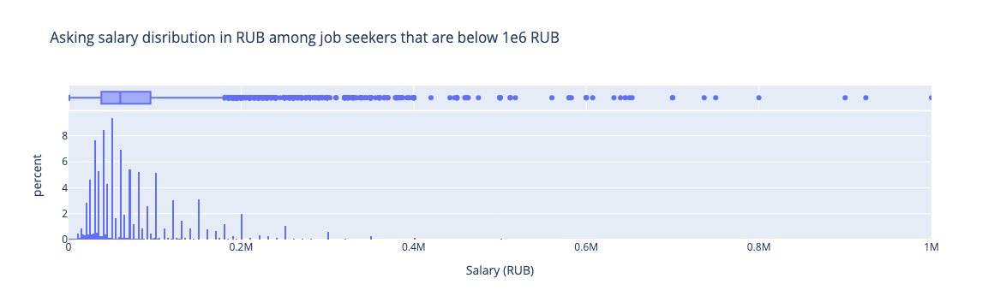

In [32]:
# ваш код здесь
fig = px.histogram(
    data_frame=data_df1,
    x='Salary (RUB)',
    width=1000,
    marginal='box',
    histnorm='percent',
    title='Asking salary disribution in RUB among job seekers that are below 1e6 RUB',
)

#update range for salary values from 0 to 1 million RUB
fig.update_xaxes(range=[0, 1000000])

print(data_df1['Salary (RUB)'].describe())
fig.show()


ваши выводы здесь

- The spread is between 1 RUB to 24.3e6 RUB. The main range is from 37k RUB to 95k RUB. The anomaly is 24.3e6 RUB.

4. Постройте диаграмму, которая показывает зависимость **медианной** желаемой заработной платы (**"ЗП (руб)"**) от уровня образования (**"Образование"**). Используйте для диаграммы данные о резюме, где желаемая заработная плата меньше 1 млн рублей.
*Сделайте выводы по представленной диаграмме: для каких уровней образования наблюдаются наибольшие и наименьшие уровни желаемой заработной платы? Как вы считаете, важен ли признак уровня образования при прогнозировании заработной платы?*

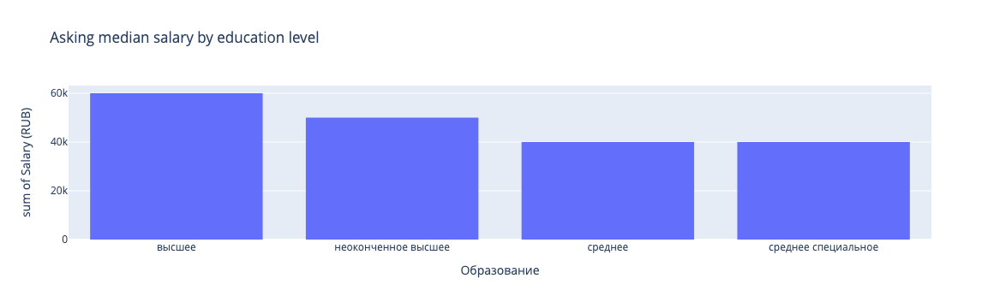

In [19]:
# ваш код здесь
#create mask to display asking salaries below 1e6 RUB
mask = data_df1['Salary (RUB)'] < 1000000

#group by education level and display median salary for each group, excluding from the median values salaries above 1e6 RUB
education_salary = data_df1[mask].groupby('Образование', as_index=False)['Salary (RUB)'].median()

fig = px.histogram(
    data_frame=education_salary,
    x='Образование',
    y='Salary (RUB)',
    title='Asking median salary by education level',
)
fig.show()

ваши выводы здесь

- The graphic of asking median salary is consistent with the education level of the job seekers. The higher the education level the higher the median salary for this group.

5. Постройте диаграмму, которая показывает распределение желаемой заработной платы (**"ЗП (руб)"**) в зависимости от города (**"Город"**). Используйте для диаграммы данные о резюме, где желая заработная плата меньше 1 млн рублей.
*Сделайте выводы по полученной диаграмме: как соотносятся медианные уровни желаемой заработной платы и их размах в городах? Как вы считаете, важен ли признак города при прогнозировании заработной платы?*

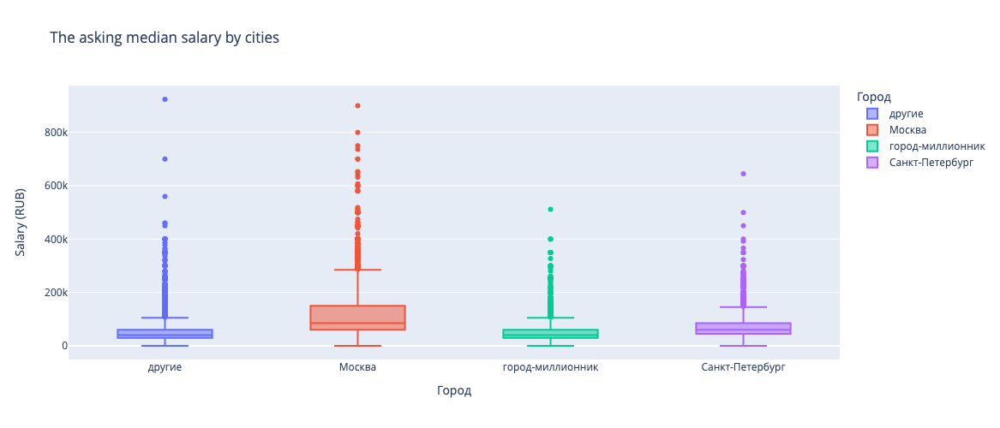

In [20]:
# ваш код здесь
box_data = data_df1[data_df1['Salary (RUB)'] < 1e6]

fig = px.box(
    data_frame=box_data,
    x='Город',
    color='Город',
    y='Salary (RUB)',
    title='The asking median salary by cities',
    height=500
)


fig.show()

ваши выводы здесь
- The capital has the highest asking median salary, followed by the second largest city in Russia, Saint Petersburg. The living expenses are higher in this cities, hence you see a higher asking median salary. We can conclude that cities with a higher living expenses will tend to have a higher median salary

6. Постройте **многоуровневую столбчатую диаграмму**, которая показывает зависимость медианной заработной платы (**"ЗП (руб)"**) от признаков **"Готовность к переезду"** и **"Готовность к командировкам"**. Проанализируйте график, сравнив уровень заработной платы в категориях.

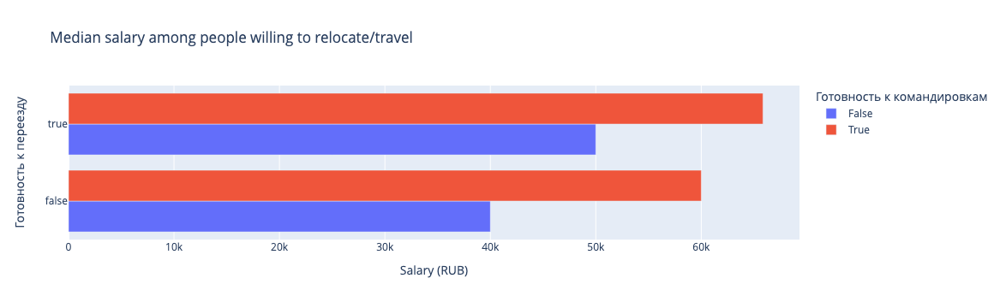

In [21]:
# ваш код здесь
bar_data = data_df1.groupby(
    ['Готовность к переезду', 'Готовность к командировкам'],
    as_index=False
)['Salary (RUB)'].median()

fig = px.bar(
    data_frame=bar_data,
    y='Готовность к переезду',
    x='Salary (RUB)',
    barmode='group',
    color='Готовность к командировкам',
    orientation='h',
    title='Median salary among people willing to relocate/travel',
)
fig.show()


ваши выводы здесь
- People that are willing to travel has an asking median salary higher compare to the people that prefer not to travel. 
- People that are willing to relocate has an asking median salary higher compare to the people that not willing to relocate.
- People that are willing to relocate and travel has the highest asking median salary

7. Постройте сводную таблицу, иллюстрирующую зависимость **медианной** желаемой заработной платы от возраста (**"Возраст"**) и образования (**"Образование"**). На полученной сводной таблице постройте **тепловую карту**. Проанализируйте тепловую карту, сравнив показатели внутри групп.

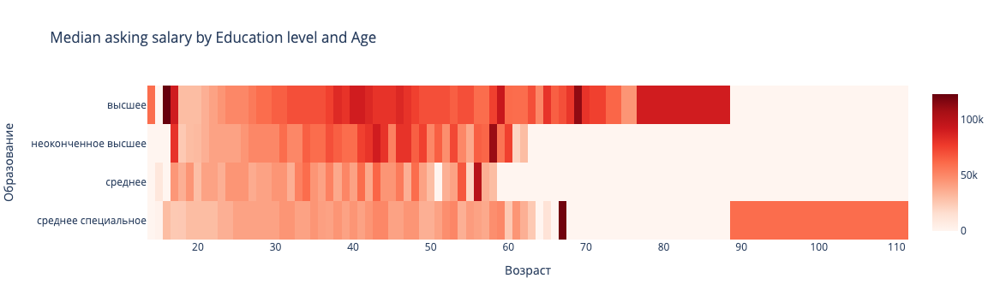

In [22]:
# ваш код здесь
pivot = data_df1.pivot_table(
    values='Salary (RUB)',
    index='Образование',
    columns='Возраст',
    aggfunc='median',
    fill_value=0,
)

fig = px.imshow(
    pivot,
    aspect='auto',
    color_continuous_scale='reds',
    title='Median asking salary by Education level and Age'
)
fig.show()

ваши выводы здесь
- The median asking salary for the people with master and bachelor degree tend to increase as the age of the person increase, it could be the factor that people becoming more expirienced and hence requiring a higher pay. On contrary with people that have a lowest education level the asking median salary stays same throughout the age spreads.

8. Постройте **диаграмму рассеяния**, показывающую зависимость опыта работы (**"Опыт работы (месяц)"**) от возраста (**"Возраст"**). Опыт работы переведите из месяцев в года, чтобы признаки были в едином масштабе. Постройте на графике дополнительно прямую, проходящую через точки (0, 0) и (100, 100). Данная прямая соответствует значениям, когда опыт работы равен возрасту человека. Точки, лежащие на этой прямой и выше нее - аномалии в наших данных (опыт работы больше либо равен возрасту соискателя)

The are 7 applications in which the years of work expirience higher then the age of the candidate


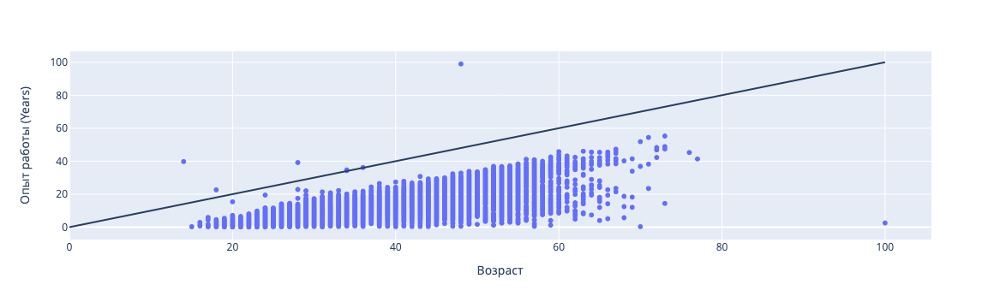

In [23]:
# ваш код здесь
#copy the dataframe and create another column where the working expirience in month
#converted to expirience in years
scatter = data_df1.copy()
scatter['Опыт работы (Years)'] = scatter['Опыт работы (месяц)'] / 12

#scatter plot with x values being age and y-values years of expirience
fig = px.scatter(
    data_frame=scatter,
    x='Возраст',
    y='Опыт работы (Years)',

)

#add additional shape to the fig with the straigt line from origin to the point 100, 100
fig.add_shape(
    type='line',
    x0=0, y0=0, x1=100, y1=100
)

#determine if there any candidate with the years of work expirience higher then the age of the candidate
x = scatter[(scatter['Опыт работы (Years)'] / scatter['Возраст'] > 1)].shape[0]
print(f'The are {x} applications in which the years of work expirience higher then the age of the candidate')
fig.show()


ваши выводы здесь
- We can see from the above graph that there are seven anomalities in which the age of the candidate is less then the work expirience for the same candidate.
- We can observe a normal trend that with increase of age the work expirience is also increasing

**Дополнительные баллы**

Для получения 2 дополнительных баллов по разведывательному анализу постройте еще два любых содержательных графика или диаграммы, которые помогут проиллюстрировать влияние признаков/взаимосвязь между признаками/распределения признаков. Приведите выводы по ним. Желательно, чтобы в анализе участвовали признаки, которые мы создавали ранее в разделе "Преобразование данных".


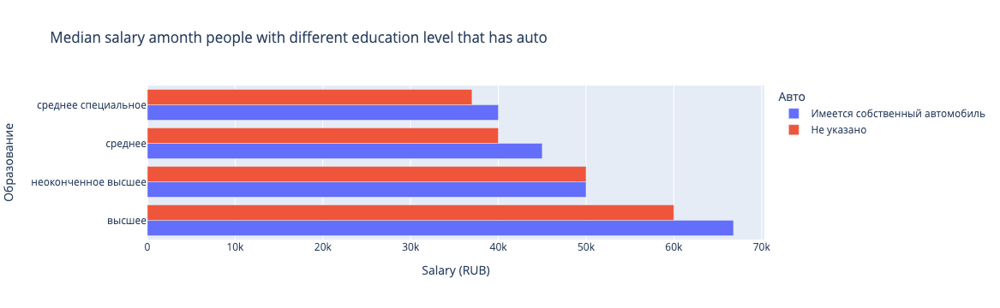

In [24]:
# ваш код здесь
#bar chart that will show relationship between median salary and the existense of auto among different education levels

#data frame that groups Education and Auto and the median salary for this group
bar_data = data_df1.groupby(
    ['Образование', 'Авто'], 
    as_index=False
)['Salary (RUB)'].median()

#bar chart that shows median salary for each education group with and without the auto
fig = px.bar(
    data_frame=bar_data,
    x='Salary (RUB)',
    y='Образование',
    color='Авто',
    barmode='group',
    orientation='h',
    title='Median salary amonth people with different education level that has auto',
)
fig.show()


ваши выводы здесь
- We can conclude from the above bar chart that people that have their own auto tend to have a higher median salary.

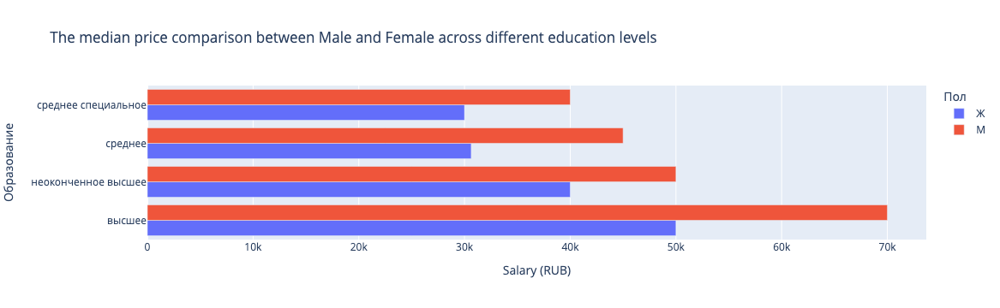

In [25]:
# ваш код здесь
#The dependance of gender on the median salary across different education levels
gender = data_df1.groupby(['Пол', 'Образование'] , as_index=False)['Salary (RUB)'].median()


#create bar chart with salary on x-axis, education level on y-axis grouped by gender
fig = px.bar(
    data_frame=gender,
    x='Salary (RUB)',
    y='Образование',
    barmode='group',
    color='Пол',
    title='The median price comparison between Male and Female across different education levels'
)

fig.show()


ваши выводы здесь
- We can observer from the above bar chart that Males has a higher median salary compare to Females.

# Очистка данных

1. Начнем с дубликатов в наших данных. Найдите **полные дубликаты** в таблице с резюме и удалите их. 

In [26]:
# ваш код здесь

#copy duplicates to a new data frame
duplicates = data_df1[data_df1.duplicated()]

#num of entries in duplicates data frame
num_of_duplicates = duplicates.shape[0]

print(f'The total number of complete duplicates in the data frame is: {num_of_duplicates}')

#drop duplicates from the original data fram
data_df1.drop_duplicates(inplace=True)


The total number of complete duplicates in the data frame is: 161


2. Займемся пропусками. Выведите информацию **о числе пропусков** в столбцах. 

In [27]:
# ваш код здесь
data_df1.isnull().sum()

Ищет работу на должность:            0
Последнее/нынешнее место работы      1
Последняя/нынешняя должность         2
Обновление резюме                    0
Авто                                 0
Образование                          0
Пол                                  0
Возраст                              0
Опыт работы (месяц)                168
Город                                0
Готовность к переезду                0
Готовность к командировкам           0
частичная занятость                  0
полный день                          0
проектная работа                     0
сменный график                       0
полная занятость                     0
гибкий график                        0
стажировка                           0
удаленная работа                     0
волонтерство                         0
вахтовый метод                       0
Salary (RUB)                         0
dtype: int64

3. Итак, у нас есть пропуски в 3ех столбцах: **"Опыт работы (месяц)"**, **"Последнее/нынешнее место работы"**, **"Последняя/нынешняя должность"**. Поступим следующим образом: удалите строки, где есть пропуск в столбцах с местом работы и должностью. Пропуски в столбце с опытом работы заполните **медианным** значением.

In [28]:
# ваш код здесь

#remove rows with missing values in 'Последнее/нынешнее место работы' and 'Последняя/нынешняя должность'
data_df1.dropna(axis=0, subset=['Последнее/нынешнее место работы', 'Последняя/нынешняя должность'], inplace=True)

#fill the missing elements with median values in 'Опыт работы (месяц) column'
data_df1.fillna(value=data_df1['Опыт работы (месяц)'].median(), inplace=True)

#mean value of the 'Опыт работы (месяц)' column rounded to the whole numbers
expirience_mean = round(data_df1['Опыт работы (месяц)'].mean(), 0)

print(f'The median value of the "Опыт работы (месяц)" column is: {expirience_mean}')

The median value of the "Опыт работы (месяц)" column is: 114.0


4. Мы добрались до ликвидации выбросов. Сначала очистим данные вручную. Удалите резюме, в которых указана заработная плата либо выше 1 млн. рублей, либо ниже 1 тыс. рублей.

In [29]:
# ваш код здесь

#create mask that filters out Salary that in the range 1e3 < 'Salary (RUB)' < 1e6
mask = (1e3 > data_df1['Salary (RUB)']) | (data_df1['Salary (RUB)'] > 1e6)

#indexes of rows that fall within the mask conditions
outliers = data_df1[mask].index

#drop rows with indexes that are in outliers
data_df1.drop(index=outliers, axis=0, inplace=True)

print(f'The number of salaries that below 1e3 RUB and above 1e6 RUB: {outliers.shape[0]}')

The number of salaries that below 1e3 RUB and above 1e6 RUB: 89


5. В процессе разведывательного анализа мы обнаружили резюме, в которых **опыт работы в годах превышал возраст соискателя**. Найдите такие резюме и удалите их из данных


In [30]:
# ваш код здесь

#mask that keeps only the entries in which the work expirience is greater then the age of applicant
mask = ((data_df1['Опыт работы (месяц)'] / 12) > (data_df1['Возраст']))

#the list with index numbers of the rows which fall under the mask conditions
outliers = data_df1[mask].index

#drop outliers from the data frame
data_df1.drop(index=outliers, axis=0, inplace=True)

print(f'The number of resumes where the work expirience is greater then the age of job seeker is: {outliers.shape[0]}')

The number of resumes where the work expirience is greater then the age of job seeker is: 7


6. В результате анализа мы обнаружили потенциальные выбросы в признаке **"Возраст"**. Это оказались резюме людей чересчур преклонного возраста для поиска работы. Попробуйте построить распределение признака в **логарифмическом масштабе**. Добавьте к графику линии, отображающие **среднее и границы интервала метода трех сигм**. Напомним, сделать это можно с помощью метода axvline. Например, для построение линии среднего будет иметь вид:

`histplot.axvline(log_age.mean(), color='k', lw=2)`

В какую сторону асимметрично логарифмическое распределение? Напишите об этом в комментарии к графику.
Найдите выбросы с помощью метода z-отклонения и удалите их из данных, используйте логарифмический масштаб. Давайте сделаем послабление на **1 сигму** (возьмите 4 сигмы) в **правую сторону**.

Выведите таблицу с полученными выбросами и оцените, с каким возрастом соискатели попадают под категорию выбросов?

,Ищет работу на должность:,Последнее/нынешнее место работы,Последняя/нынешняя должность,Обновление резюме,Авто,Образование,Пол,Возраст,Опыт работы (месяц),Город,...,полный день,проектная работа,сменный график,полная занятость,гибкий график,стажировка,удаленная работа,волонтерство,вахтовый метод,Salary (RUB)
31137,Менеджер по работе с клиентами,"ООО ""ФёрстКэшКомпани""",Менеджер по работе с клиентами,2019-04-06,Не указано,среднее,М,15,2.0,Санкт-Петербург,...,False,False,True,False,True,False,True,False,False,10000.0
32950,Тестировщик игр,OOO ЖМЫХ,Тестировщик ПО,2019-04-09,Не указано,среднее специальное,М,15,3.0,другие,...,True,False,False,True,False,False,False,False,False,2000.0
33654,Frontend-разработчик,Freelance,Frontend-разработчик,2019-04-19,Не указано,среднее специальное,М,100,30.0,Санкт-Петербург,...,True,True,False,True,True,True,True,False,False,60000.0


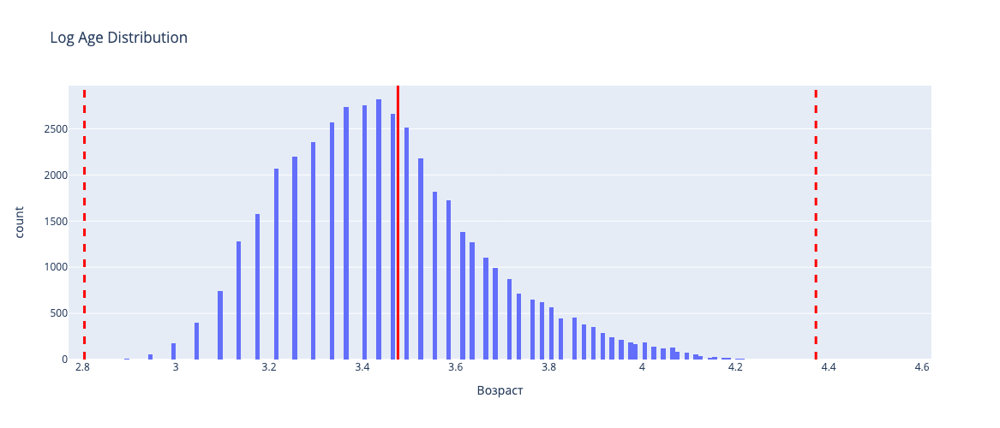

In [67]:
# ваш код здесь


#take log of 'Age' column
log_age = np.log(data_df1['Возраст'] + 1)

#mean value of log_age series
mean = log_age.mean()

#sigma value which is standard deviation of log_age series
sigma = log_age.std()

#build a histogram with 'Возраст' in a x axis
fig = px.histogram(
    data_frame=log_age,
    x='Возраст',
    height=500,
    title='Log Age Distribution'
)


#add a solid vertical line to mean value of the series
fig.add_vline(x=mean, line_width=3, line_dash='solid', line_color='red')
#add a dash vertical line to mean - 3*std
fig.add_vline(x=mean - 3*sigma, line_dash='dash', line_width=3, line_color='red')
#add a dash vertical line to mean + 4*std
fig.add_vline(x=mean + 4*sigma, line_dash='dash', line_width=3, line_color='red')


def outliers_z_score(data, column):
    x = np.log(data[column] + 1)
    mean = x.mean()
    sigma = x.std()
    lower_bound = mean - 3*sigma
    upper_bound = mean + 4*sigma
    
    outliers = data[(x < lower_bound) | (x > upper_bound)]
    cleaned = data[(x > lower_bound) & (x < upper_bound)]
    
    return outliers, cleaned

outliers, cleaned = outliers_z_score(data_df1, 'Возраст')

display(outliers)

fig.show()

ваш коммментарий здесь